In [1]:
! pip install yfinance
! pip install arch
! pip install statsmodels
! pip install hmmlearn
! pip install pgmpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 982.9/982.9 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 23.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.6/162.6 kB 8.3 MB/s eta 0:00:00


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
import yfinance as yf
import warnings
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)

from numpy.linalg import eig
from sklearn.preprocessing import QuantileTransformer

import statsmodels.api as sm
from statsmodels.tsa.api import VAR
from statsmodels.tsa.arima.model import ARIMA
from arch.unitroot import ADF, KPSS
from arch import arch_model
from statsmodels.stats.diagnostic import acorr_ljungbox
from scipy.stats import norm, t
from hmmlearn.hmm import CategoricalHMM
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from arch.unitroot import ADF, KPSS
from hmmlearn.hmm import GaussianHMM
import networkx as nx
from pgmpy.estimators import (HillClimbSearch, BIC,BayesianEstimator,ExpertKnowledge,)
from pgmpy.models import DiscreteBayesianNetwork
from pgmpy.inference import VariableElimination
from pgmpy.estimators import (
    HillClimbSearch,
    PC,
    BIC,
    BDeu,
    BayesianEstimator
)
from pgmpy.models import DiscreteBayesianNetwork

# **Importong Data, Cleaning and Data Exploratory**

### **Importing Data : Step 1**

In [3]:
# Macroecoonomic &b weather data
print("Macroecoonomic &b weather data")
data = pd.read_excel('Project Data.xlsx')
data['Date'] = pd.to_datetime(data['Month'])
data.set_index('Date', inplace=True)
data.drop(columns=['Month'], inplace=True)
data = data.loc['1997-12-01':'2024-03-01',:]


# Microeconomic Data
micr_df = pd.read_csv('microeconomic_data.csv')
micr_df['Date'] = pd.to_datetime(micr_df['observation_date'])
micr_df.set_index('Date', inplace=True)
micr_df.drop(columns=['observation_date'], inplace=True)
micr_df = micr_df.loc['1997-12-01':'2024-03-01',:]


# geopolitical risk data
geo_risk = pd.read_excel('geo risk index.xlsx')
geo_risk['Date'] = pd.to_datetime(geo_risk['Unnamed: 0'])
geo_risk.drop(columns=['Unnamed: 0'], inplace=True)
geo_risk.set_index('Date', inplace=True)
geo_risk = geo_risk.loc['1997-12-01':'2024-03-01',:]


# google trend
#google_trends = pd.read_excel('goodle trend.xlsx')
#google_trends['Date'] = pd.to_datetime(google_trends['Time'])
#google_trends.set_index('Date', inplace=True)
#google_trends.drop(columns=['Time'], inplace=True)

# drop total consupmtion, production, and japan industrial production index
data.drop(columns = ['Total World Petroleum Production million barrels per day', 'World Crude Oil Production million barrels per day',
                     'Total World Petroleum Consumption million barrels per day', 'japan industrial production'], inplace = True)

# rename columns
data = data.rename(columns={'Monthly mean temperature anomalies in degrees Celsius relative to a base period':'Temp_mean_anom',
   'OPEC Crude Oil Production million barrels per day': 'opec_product',
    'Non-OPEC Crude Oil Production million barrels per day': 'nonopec_product',
    'Total OECD Petroleum Consumption million barrels per day': 'oecd_consump',
    'Total non-OECD Petroleum Consumption million barrels per day': 'nonoecd_consump',
    'World Total Crude Oil and Other Liquids Inventory Net Withdrawals million barrels per day': 'world_inv',
    'us industrial production': 'us_inds',
    'india industrial production': 'india_inds',
    'russia industrial production': 'russia_inds',
    'OECD industrial production': 'oecd_inds',
    'china industrial production': 'china_inds'
})


display(data.head())
print("#" * 80)
print("Geopolitical Risk")
display(geo_risk.head())
#print("Google Trend")
#display(google_trends.head())
print("#" * 80)
print("Microeconomic Data")
display(micr_df.head())

print(data.isna().sum()/len(data) * 100)
print(geo_risk.isna().sum()/len(geo_risk)* 100)
print(micr_df.isna().sum()/len(micr_df)* 100)


Macroecoonomic &b weather data


,Temp_mean_anom,oecd_inds,russia_inds,us_inds,india_inds,china_inds,opec_product,nonopec_product,oecd_consump,nonoecd_consump,world_inv
Date,,,,,,,,,,,
1997-12-01,0.59,4.907532,56.01672,83.9538,37.42739,NaN,23.44,41.90,49.88,26.34,1.16
1998-01-01,0.58,5.138793,53.75848,84.3218,37.61060,NaN,24.35,42.21,46.89,26.18,-3.41
1998-02-01,0.88,4.147248,56.25964,84.4583,37.98297,NaN,24.81,42.12,48.32,26.18,-2.40
1998-03-01,0.63,3.258378,55.47150,84.4880,37.46576,NaN,24.75,42.07,48.12,26.18,-2.41
1998-04-01,0.63,3.060517,54.76664,84.7779,37.93493,NaN,24.75,41.92,46.38,26.38,-3.84


################################################################################
Geopolitical Risk


,GPRD
Date,
1997-12-01,72.01
1997-12-02,55.36
1997-12-03,51.87
1997-12-04,43.22
1997-12-05,47.76


################################################################################
Microeconomic Data


,CAPUTLG211S,A24STI,IPG21112S
Date,,,
1997-12-01,93.4168,12203.0,68.9948
1998-01-01,95.8255,11093.0,69.9787
1998-02-01,94.6905,10992.0,68.6536
1998-03-01,94.4616,10916.0,67.9870
1998-04-01,95.4318,10850.0,69.0080


Temp_mean_anom      0.000000
oecd_inds           0.000000
russia_inds         8.544304
us_inds             0.000000
india_inds          4.430380
china_inds         10.759494
opec_product        0.000000
nonopec_product     0.000000
oecd_consump        0.000000
nonoecd_consump     0.000000
world_inv           3.797468
dtype: float64
GPRD    0.0
dtype: float64
CAPUTLG211S    0.0
A24STI         0.0
IPG21112S      0.0
dtype: float64


In [4]:
print(data.shape)
print(geo_risk.shape)
print(micr_df.shape)

(316, 11)
(9588, 1)
(316, 3)


In [5]:
# geopolitical risk index , chang data to monthly, get average of daily data
geo_risk = geo_risk.resample('M').mean()
#goog_trend = goog_trend.resample('M').mean()
#micr_df = micr_df.resample('M').mean()

data['geo_risk'] = geo_risk['GPRD'].values
data['IPG21112S'] = micr_df['IPG21112S'].values
data['A24STI'] = micr_df['A24STI'].values
data['CAPUTLG211S'] = micr_df['CAPUTLG211S'].values

# clean data
#data['world_inv'] = (data['world_inv'].replace('--', np.nan))
#data['world_inv'] = pd.to_numeric(data['world_inv'], errors='coerce')
# replace nan value with backwards
values = [-1.37, 2.16, -0.43, 0.05, -0.71, -0.59,
          -1.56, -0.51, 0.57, -0.30, -0.81, -0.11] # sum of oecd and usa
mask = data['world_inv'].isna()
data.loc[mask, 'world_inv'] = values
data['china_inds'] = data['china_inds'].fillna(method='bfill')
data = data.fillna(method='ffill')
print(data.isna().sum())
print(data.shape)

# download financial data
ticker = ['^VIX', 'DX-Y.NYB', '^IXIC']
finance_data = yf.download(ticker, start='1997-12-01', end='2024-04-01', interval = '1mo', auto_adjust= False)['Adj Close']

dgs_10 = pd.read_csv('DGS10.csv') # bond
dgs_10['DATE'] = pd.to_datetime(dgs_10['observation_date'])
dgs_10.drop(columns=['observation_date'], inplace=True)
dgs_10.set_index('DATE', inplace=True)
dgs_10_monthly = dgs_10.resample('ME').mean()    # Monthly average
dgs_10_monthly = dgs_10_monthly.loc['1997-12-01':'2024-04-01',:]



# to avoid nan values
cl_daily = pd.read_csv('DCOILWTICO.csv')
cl_daily['Date'] = pd.to_datetime(cl_daily['observation_date'])
cl_daily.drop(columns=['observation_date'], inplace=True)
cl_daily.set_index('Date', inplace=True)
cl_monthly = cl_daily.resample('ME').mean()    # Monthly average
cl_monthly = cl_monthly.loc['1997-12-01':'2024-04-01',:]



data['vix'] = finance_data['^VIX'].values
data['DX_Y_NYB'] = finance_data['DX-Y.NYB'].values
data['nasdaq'] = finance_data['^IXIC'].values
data['dgs10'] = dgs_10_monthly.values

data['cl_f'] = cl_monthly.values

data.to_csv('data_final.csv')

data_final = pd.read_csv('data_final.csv')
data_final['Date'] = pd.to_datetime(data_final['Date'])
data_final.set_index('Date', inplace=True)
display(data_final.head())
data_final.isna().sum()
data_final.shape

Temp_mean_anom     0
oecd_inds          0
russia_inds        0
us_inds            0
india_inds         0
china_inds         0
opec_product       0
nonopec_product    0
oecd_consump       0
nonoecd_consump    0
world_inv          0
geo_risk           0
IPG21112S          0
A24STI             0
CAPUTLG211S        0
dtype: int64
(316, 15)


[*********************100%***********************]  3 of 3 completed


,Temp_mean_anom,oecd_inds,russia_inds,us_inds,india_inds,china_inds,opec_product,nonopec_product,oecd_consump,nonoecd_consump,world_inv,geo_risk,IPG21112S,A24STI,CAPUTLG211S,vix,DX_Y_NYB,nasdaq,dgs10,cl_f
Date,,,,,,,,,,,,,,,,,,,,
1997-12-01,0.59,4.907532,56.01672,83.9538,37.42739,117.9,23.44,41.90,49.88,26.34,1.16,44.193226,68.9948,12203.0,93.4168,24.010000,99.650002,1570.349976,5.808636,18.332727
1998-01-01,0.58,5.138793,53.75848,84.3218,37.61060,117.9,24.35,42.21,46.89,26.18,-3.41,53.143548,69.9787,11093.0,95.8255,21.469999,100.790001,1619.359985,5.544500,16.724000
1998-02-01,0.88,4.147248,56.25964,84.4583,37.98297,117.9,24.81,42.12,48.32,26.18,-2.40,77.333214,68.6536,10992.0,94.6905,18.549999,99.820000,1770.510010,5.574737,16.060000
1998-03-01,0.63,3.258378,55.47150,84.4880,37.46576,117.9,24.75,42.07,48.12,26.18,-2.41,57.528065,67.9870,10916.0,94.4616,24.219999,101.500000,1835.680054,5.647273,15.115455
1998-04-01,0.63,3.060517,54.76664,84.7779,37.93493,117.9,24.75,41.92,46.38,26.38,-3.84,50.222000,69.0080,10850.0,95.4318,21.180000,99.709999,1868.410034,5.637619,15.353810


(316, 20)

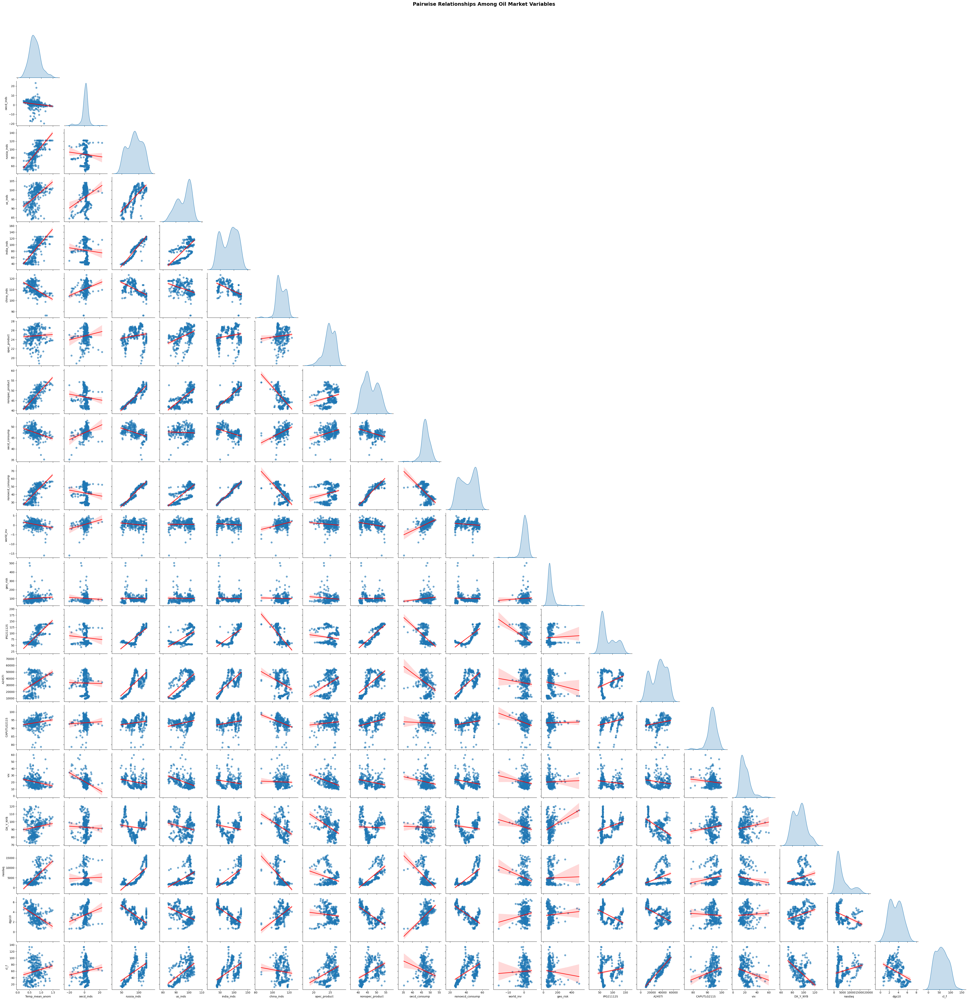

In [6]:
pair_df = data_final.copy()
g = sns.pairplot(data_final,kind="reg",diag_kind="kde", plot_kws={"scatter_kws": {"alpha": 0.6, "s": 35},"line_kws": {"color": "red", "lw": 2}},
    diag_kws={"fill": True},corner=True)

g.fig.suptitle("Pairwise Relationships Among Oil Market Variables",fontsize=18,fontweight="bold",y=1.02)
plt.savefig("all_variables_pairplot.png", dpi=300, bbox_inches="tight")

plt.show()

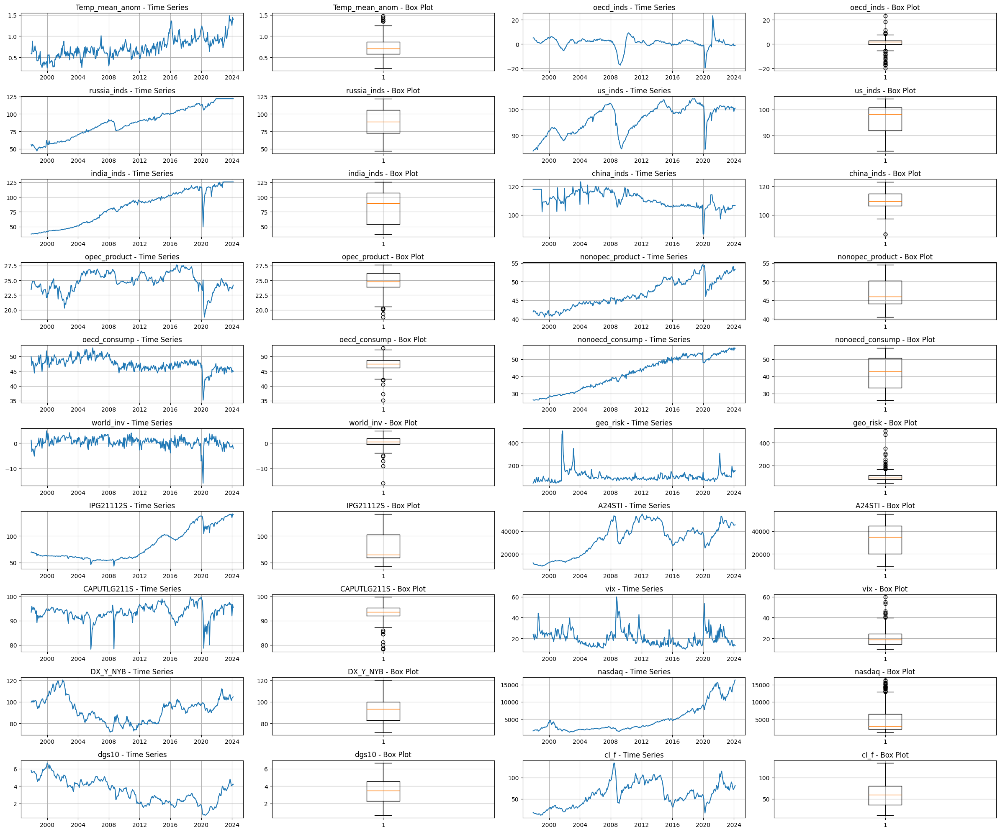

In [7]:
fig, axes = plt.subplots(nrows=10,ncols=4,figsize=(24, 20))
for i, col in enumerate(pair_df.columns):
    row = i // 2
    col_pos = i % 2
    # Time series
    axes[row, col_pos * 2].plot(pair_df.index, pair_df[col])
    axes[row, col_pos * 2].set_title(f"{col} - Time Series")
    axes[row, col_pos * 2].grid(True)

    # Box plot
    axes[row, col_pos * 2 + 1].boxplot(pair_df[col].dropna())
    axes[row, col_pos * 2 + 1].set_title(f"{col} - Box Plot")
    axes[row, col_pos * 2 + 1].grid(True)

plt.tight_layout()

# Save everything as ONE image
plt.savefig("all_variables_plot_box.png", dpi=300, bbox_inches="tight")

plt.show()

### **Cleaning Data: Step 5**

##### **Target**

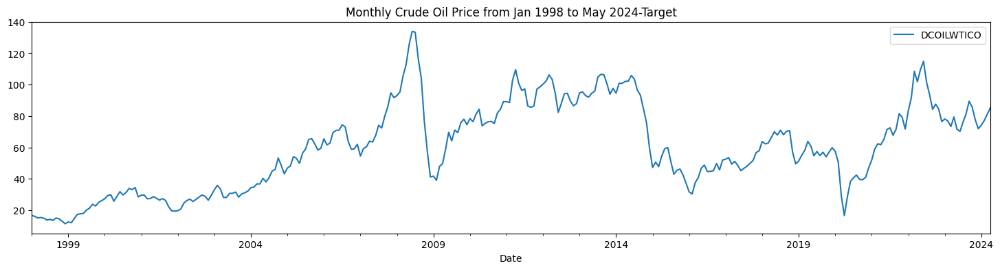

None

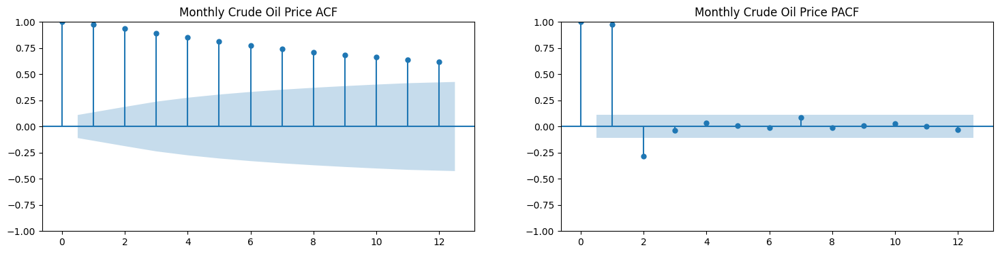

None

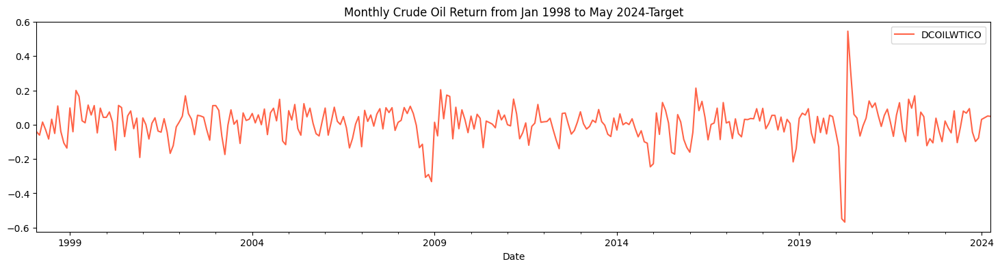

None

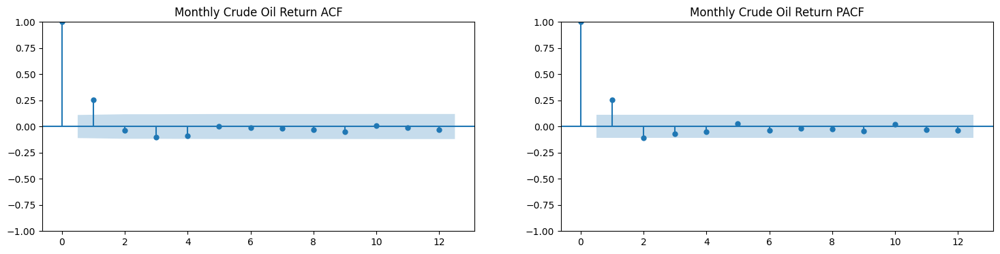

None

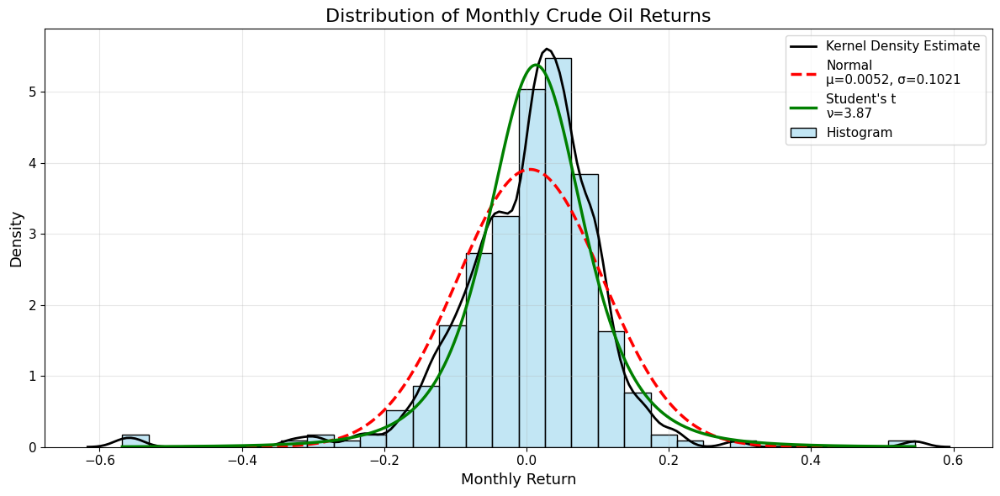

In [8]:
# define target: we want to predict next month oil price
y = pd.read_csv('DCOILWTICO.csv')
y['Date'] = pd.to_datetime(y['observation_date'])
y.drop(columns=['observation_date'], inplace=True)
y.set_index('Date', inplace=True)
y_monthly = y.resample('ME').mean()    # Monthly average
y_monthly = y_monthly.loc['1998-01-01':'2024-05-01',:]

fig, ax = plt.subplots(figsize=(18, 4))
y_monthly.plot(ax=ax)
plt.title('Monthly Crude Oil Price from Jan 1998 to May 2024-Target')
plt.legend()
display(plt.show())
fig, ax = plt.subplots(1, 2, figsize=(18, 4))
sm.graphics.tsa.plot_acf(y_monthly, title="Monthly Crude Oil Price ACF", lags=12, ax=ax[0])
sm.graphics.tsa.plot_pacf(y_monthly, title="Monthly Crude Oil Price PACF", lags=12, ax=ax[1])
display(plt.show())

y_return = np.log(y_monthly).diff().dropna()
fig, ax = plt.subplots(figsize=(18, 4))
y_return.plot(ax=ax, color ='tomato')
plt.title('Monthly Crude Oil Return from Jan 1998 to May 2024-Target')
plt.legend()
display(plt.show())

fig, ax = plt.subplots(1, 2, figsize=(18, 4))
sm.graphics.tsa.plot_acf(y_return, title="Monthly Crude Oil Return ACF", lags=12, ax=ax[0])
sm.graphics.tsa.plot_pacf(y_return, title="Monthly Crude Oil Return PACF", lags=12, ax=ax[1])
display(plt.show())


returns = y_return.dropna().squeeze()   # ensure 1D array

# Fit distributions
mu, sigma = norm.fit(returns)
df, loc, scale = t.fit(returns)

# Grid for PDFs
x = np.linspace(returns.min(), returns.max(), 500)

plt.figure(figsize=(12,6))

# Histogram
sns.histplot(returns,bins=30,stat="density",color="skyblue",alpha=0.5,edgecolor="black",label="Histogram")

# KDE
sns.kdeplot(returns,color="black",linewidth=2,bw_adjust=0.5,label="Kernel Density Estimate")

# Normal distribution
plt.plot(x,norm.pdf(x, mu, sigma),color="red",linewidth=2.5,linestyle="--",label=f"Normal\nμ={mu:.4f}, σ={sigma:.4f}")

# Student's t distribution
plt.plot(x,t.pdf(x, df, loc, scale),color="green",linewidth=2.5,label=f"Student's t\nν={df:.2f}")

plt.title("Distribution of Monthly Crude Oil Returns", fontsize=16)
plt.xlabel("Monthly Return", fontsize=13)
plt.ylabel("Density", fontsize=13)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.legend(fontsize=11)
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

###### **Compare Target, Crude Oil Price with Othe Commodities**

[*********************100%***********************]  6 of 6 completed


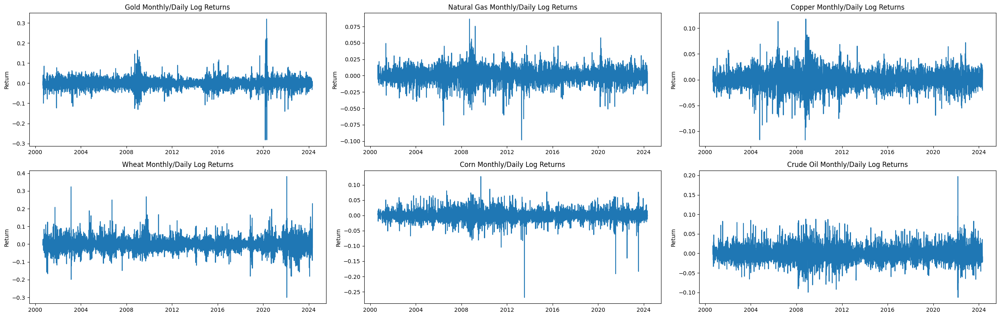

None

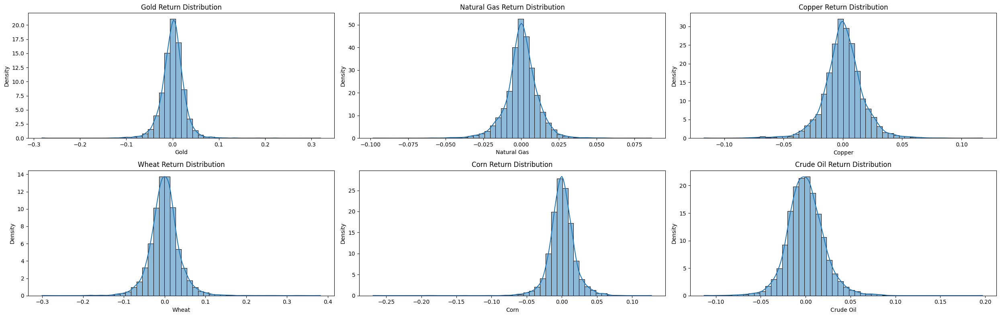

None

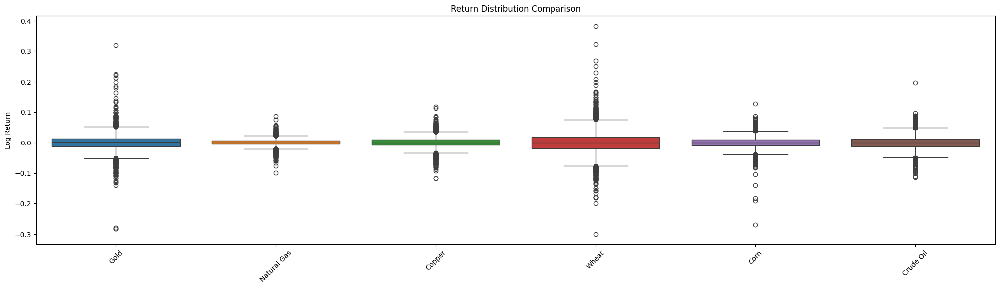

None

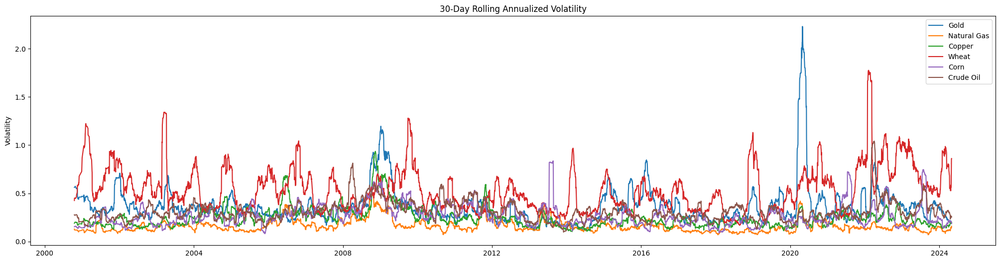

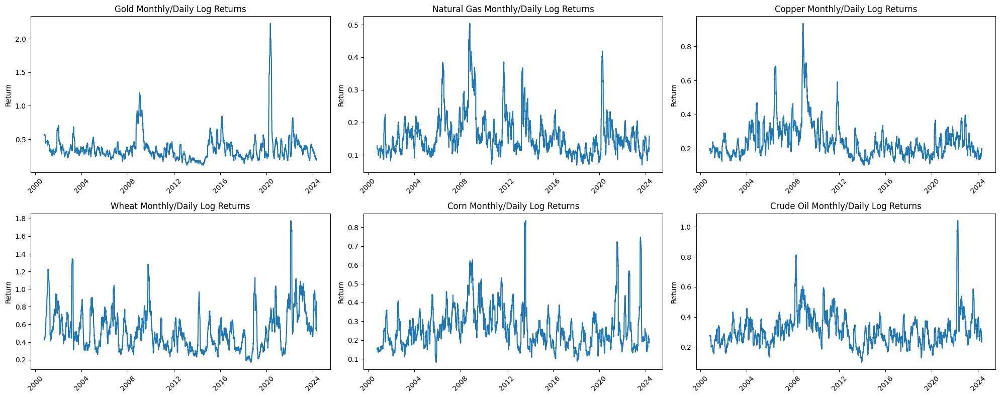

None

In [9]:
ticker = ['GC=F', 'NG=F', 'HG=F', 'ZW=F', 'ZC=F', 'CL=F']

# Download prices
comm_df = yf.download(ticker,start='1998-01-01',end='2024-05-01',auto_adjust=False)['Adj Close']

# Log returns
ret_df = np.log(comm_df).diff().dropna()
ret_df.columns = ['Gold', 'Natural Gas', 'Copper', 'Wheat', 'Corn', 'Crude Oil']

fig, ax = plt.subplots(2,3, figsize=(25,8))
# line plot
for col, a in zip(ret_df.columns, ax.flatten()):
    a.plot(ret_df[col])
    a.set_title(f'{col} Monthly/Daily Log Returns')
    a.set_xlabel('')
    a.set_ylabel('Return')

plt.tight_layout()
display(plt.show())
# histogram
fig, ax = plt.subplots(2,3, figsize=(25,8))
for col, a in zip(ret_df.columns, ax.flatten()):
    sns.histplot(ret_df[col],kde=True,stat='density',bins=50, ax=a)
    a.set_title(f'{col} Return Distribution')

plt.tight_layout()
display(plt.show())
# boxplot
plt.figure(figsize=(25,6))
sns.boxplot(data=ret_df)
plt.title('Return Distribution Comparison')
plt.ylabel('Log Return')
plt.xticks(rotation=45)
display(plt.show())
# rolling vol
rolling_vol = ret_df.rolling(30).std() * np.sqrt(252)
plt.figure(figsize=(25,6))
for col in rolling_vol.columns:
    plt.plot(rolling_vol[col], label=col)
plt.title('30-Day Rolling Annualized Volatility')
plt.ylabel('Volatility')
plt.legend()
(plt.show())

fig, ax = plt.subplots(2,3, figsize=(20,8))
for col, a in zip(rolling_vol.columns, ax.flatten()):
    a.plot(rolling_vol[col])
    a.set_title(f'{col} Monthly/Daily Log Returns')
    a.tick_params(axis='x', rotation=45)
    a.set_xlabel('')
    a.set_ylabel('Return')
plt.tight_layout()
display(plt.show())

##### **Variables**

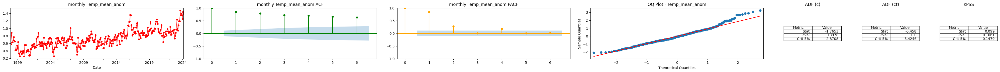

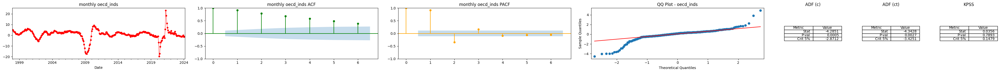

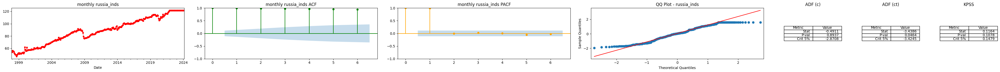

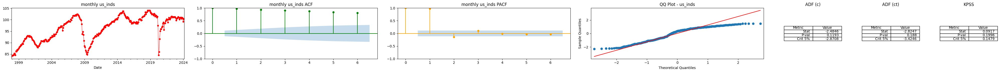

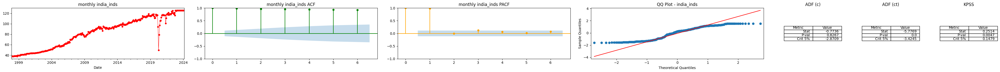

...

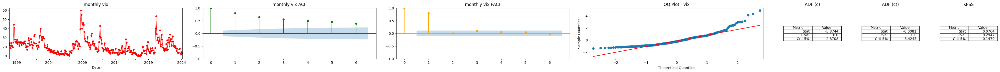

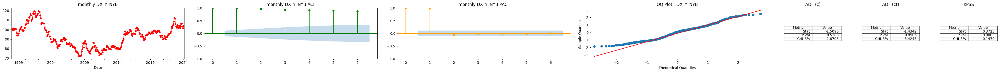

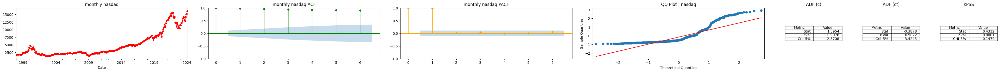

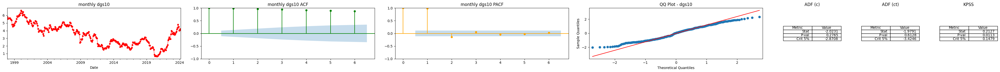

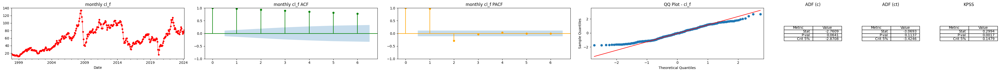

,Variable,ADF(c) Stat,ADF(c) p,ADF(ct) Stat,ADF(ct) p,KPSS Stat,KPSS p
0,Temp_mean_anom,-1.7653,0.3978,-5.4580,0.0000,0.0990,0.1661
1,oecd_inds,-4.2851,0.0005,-4.3428,0.0027,0.0356,0.7893
2,russia_inds,-0.4911,0.8937,-3.4386,0.0464,0.1164,0.1078
3,us_inds,-2.4846,0.1193,-2.8247,0.1880,0.0917,0.1996
4,india_inds,-0.7736,0.8267,-5.7769,0.0000,0.2514,0.0047
5,china_inds,-2.8348,0.0535,-4.4875,0.0016,0.2213,0.0092
6,opec_product,-2.9432,0.0405,-2.9164,0.1570,0.2075,0.0128
7,nonopec_product,-1.0982,0.7158,-4.4011,0.0022,0.0769,0.2905
8,oecd_consump,-1.9865,0.2925,-3.0942,0.1076,0.1139,0.1145
9,nonoecd_consump,-0.6364,0.8625,-2.4371,0.3601,0.2748,0.0028


In [10]:
df = data_final.copy()
results = []

def plots(col):

    fig, axes = plt.subplots(1, 7,figsize=(40,3),gridspec_kw={"width_ratios":[3,3,3,3,1,1,1]})
    df[col].plot(marker="o",markersize=4, color="red",linestyle="-",linewidth=0.8,title=f"monthly {col}",ax=axes[0])
    sm.graphics.tsa.plot_acf(df[col],lags=6,title=f"monthly {col} ACF",color="green",vlines_kwargs={"colors":"green"}, ax=axes[1])
    sm.graphics.tsa.plot_pacf(df[col],lags=6,title=f"monthly {col} PACF",color="orange",vlines_kwargs={"colors":"orange"},ax=axes[2])
    sm.qqplot(df[col], line="q", fit=True, ax=axes[3])
    axes[3].set_title(f"QQ Plot - {col}")

    adf_c = ADF(df[col].dropna(), trend="c", method="bic")
    adf_ct = ADF(df[col].dropna(), trend="ct", method="bic")
    kpss = KPSS(df[col].dropna(), trend="ct", lags=-1)

    # ADF(c)
    table_data = [["Stat", round(adf_c.stat,4)], ["P-val", round(adf_c.pvalue,4)],["Crit 5%", round(adf_c.critical_values["5%"],4)]]
    axes[4].axis("off")
    axes[4].table(cellText=table_data,
                  colLabels=["Metric","Value"],
                  loc="center")
    axes[4].set_title("ADF (c)")

    # ADF(ct)
    table_data = [["Stat", round(adf_ct.stat,4)],["P-val", round(adf_ct.pvalue,4)],["Crit 5%", round(adf_ct.critical_values["5%"],4)]]
    axes[5].axis("off")
    axes[5].table(cellText=table_data,colLabels=["Metric","Value"],loc="center")
    axes[5].set_title("ADF (ct)")

    # KPSS
    table_data = [["Stat", round(kpss.stat,4)],["P-val", round(kpss.pvalue,4)],["Crit 5%", round(kpss.critical_values["5%"],4)]]
    axes[6].axis("off")
    axes[6].table(cellText=table_data,colLabels=["Metric","Value"],loc="center")
    axes[6].set_title("KPSS")

    plt.tight_layout()
    plt.show()

    # Return results
    return {
        "Variable": col,
        "ADF(c) Stat": round(adf_c.stat,4),
        "ADF(c) p": round(adf_c.pvalue,4),
        "ADF(ct) Stat": round(adf_ct.stat,4),
        "ADF(ct) p": round(adf_ct.pvalue,4),
        "KPSS Stat": round(kpss.stat,4),
        "KPSS p": round(kpss.pvalue,4),
    }



for col in df.columns:
    results.append(plots(col))

stationarity_df = pd.DataFrame(results)

stationarity_df

###### **Transformation and Scaling**

In [11]:
# need to be corrected
df_trans = df.copy()

# 1. First Difference
first_diff = [ 'geo_risk','IPG21112S', 'A24STI','dgs10']
for col in first_diff:
    df_trans[col] = df[col].diff()


# 2. Log Difference (Growth Rate) & Log Returns (Financial Prices)
log_diff = ["russia_inds","us_inds",
    "india_inds","china_inds",'nonopec_product', 'oecd_consump',
       'nonoecd_consump','DX_Y_NYB', 'nasdaq','cl_f']
for col in log_diff:
    df_trans[col] = np.log(df[col]).diff()
df_trans = df_trans.dropna().reset_index(drop=True)

# now do scaling to have the data without unit
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df_trans[df_trans.columns] = scaler.fit_transform(df_trans[df_trans.columns])

df_trans.head()

,Temp_mean_anom,oecd_inds,russia_inds,us_inds,india_inds,china_inds,opec_product,nonopec_product,oecd_consump,nonoecd_consump,world_inv,geo_risk,IPG21112S,A24STI,CAPUTLG211S,vix,DX_Y_NYB,nasdaq,dgs10,cl_f
0,0.268293,0.579179,0.173943,0.711566,0.583405,0.583391,0.630804,0.830306,0.500437,0.599665,0.603448,0.351860,0.632782,0.500348,0.820464,0.237396,0.536306,0.633953,0.483117,0.427585
1,0.512195,0.556172,0.548333,0.698114,0.587892,0.583391,0.682899,0.775213,0.817603,0.632995,0.651820,0.376590,0.571528,0.564197,0.767424,0.179436,0.382704,0.761485,0.651189,0.473660
2,0.308943,0.535547,0.290812,0.691935,0.566615,0.583391,0.676104,0.780700,0.699555,0.632995,0.651341,0.305197,0.588997,0.565779,0.756727,0.291981,0.575099,0.645757,0.675340,0.455617
3,0.308943,0.530956,0.296517,0.706937,0.590234,0.583391,0.676104,0.766883,0.586710,0.674625,0.582854,0.325480,0.633766,0.566411,0.802066,0.231640,0.323424,0.605485,0.628414,0.524070
4,0.349593,0.527687,0.158522,0.722283,0.579573,0.583391,0.679502,0.709639,0.560121,0.632995,0.516284,0.408558,0.572218,0.558945,0.783228,0.234418,0.507251,0.459908,0.642422,0.483938


### **Exploratory Analysis:Step 7**

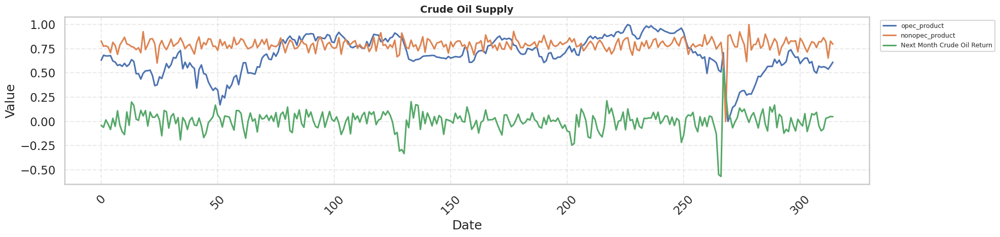

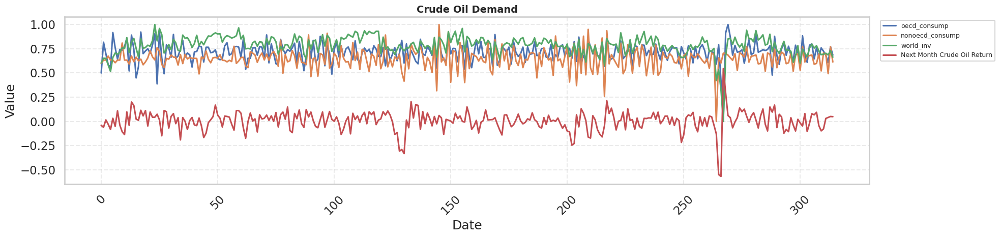

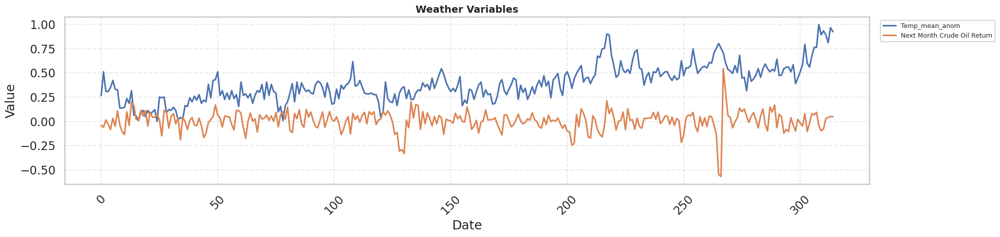

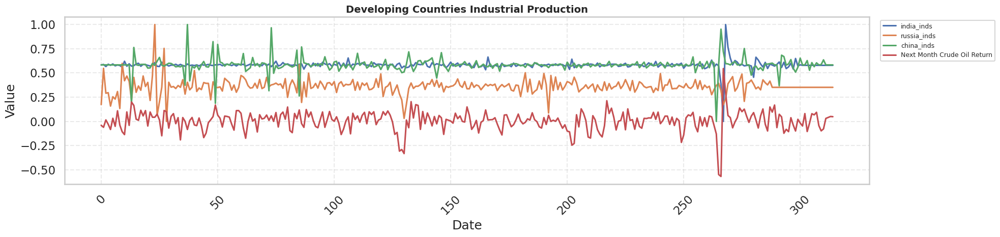

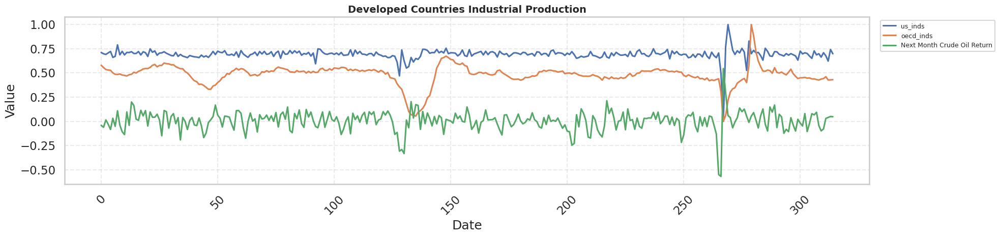

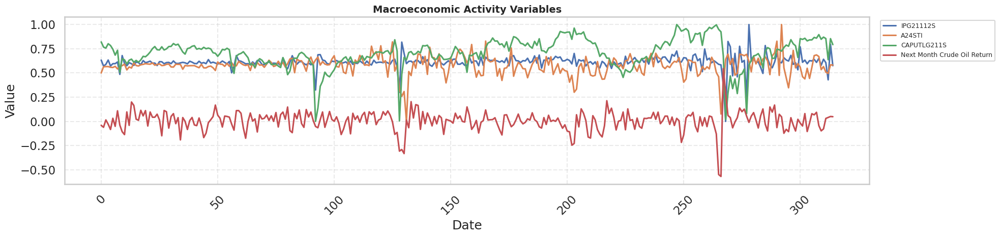

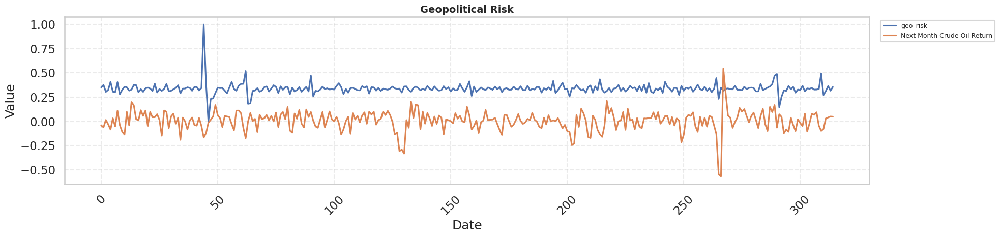

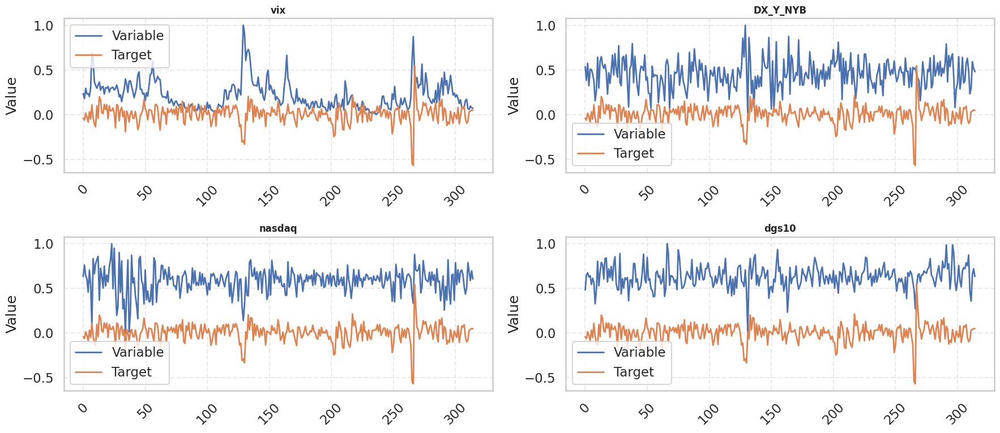

In [12]:
# Time Series of Variables and Target

target = np.log(y_monthly).diff().dropna()

supply_df = df_trans[['opec_product','nonopec_product']]
supply_df['Next Month Crude Oil Return'] = target.values

demand_df = df_trans[['oecd_consump','nonoecd_consump','world_inv']]
demand_df['Next Month Crude Oil Return'] = target.values

weather_df = df_trans[['Temp_mean_anom']]
weather_df['Next Month Crude Oil Return'] = target.values

developing_industry_df = df_trans[['india_inds','russia_inds','china_inds']]
developing_industry_df['Next Month Crude Oil Return'] = target.values

developed_industry_df = df_trans[['us_inds','oecd_inds']]
developed_industry_df['Next Month Crude Oil Return'] = target.values

micro_data = df_trans[['IPG21112S', 'A24STI', 'CAPUTLG211S']]
micro_data['Next Month Crude Oil Return'] = target.values

financial_df = df_trans[['vix','DX_Y_NYB', 'nasdaq', 'dgs10']]
financial_df['Next Month Crude Oil Return'] = target.values

geop_df = df_trans[['geo_risk']]
geop_df['Next Month Crude Oil Return'] = target.values



sns.set_theme(style="whitegrid", context="talk")


def plot_group(df, title):
    fig, ax = plt.subplots(figsize=(20, 5))
    for col in df.columns:
        ax.plot(df.index, df[col], linewidth=2.2, label=col)

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel("Date")
    ax.set_ylabel("Value")

    ax.legend(loc="upper left",bbox_to_anchor=(1.01, 1),frameon=True,fontsize=9)

    ax.grid(True, linestyle='--', alpha=0.4)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


plot_group(supply_df, "Crude Oil Supply")
plot_group(demand_df, "Crude Oil Demand")
plot_group(weather_df, "Weather Variables")
plot_group(developing_industry_df, "Developing Countries Industrial Production")
plot_group(developed_industry_df, "Developed Countries Industrial Production")
plot_group(micro_data, "Macroeconomic Activity Variables")
plot_group(geop_df, "Geopolitical Risk")


# Financial Variables
fig, ax = plt.subplots(2, 2, figsize=(18, 8))

for col, a in zip(financial_df.columns, ax.flatten()):
    a.plot(financial_df.index, financial_df[col], linewidth=2)
    a.plot(financial_df.index, target.values, linewidth=2)
    a.set_title(col, fontsize=12, fontweight='bold')
    a.set_xlabel("")
    a.set_ylabel("Value")
    a.legend(["Variable", "Target"])
    a.tick_params(axis='x', rotation=45)
    a.grid(True, linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()

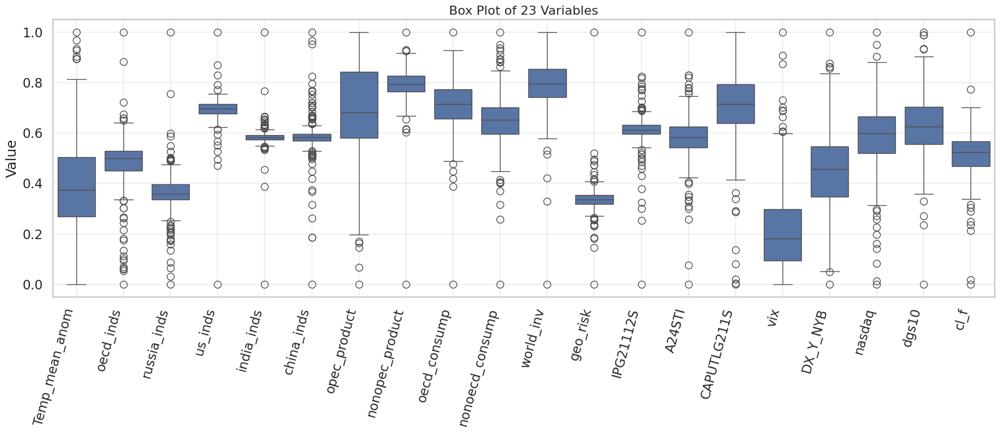

In [13]:
def plot_boxplot_23(df, columns):
     # Convert dataframe to long format
    data = df[columns].melt(var_name="Variable",value_name="Value")
    plt.figure(figsize=(18, 8))
    sns.boxplot(data=data,x="Variable", y="Value")
    plt.title("Box Plot of 23 Variables", fontsize=16)
    plt.xlabel("")
    plt.ylabel("Value")
    plt.xticks(rotation=75, ha="right")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

plot_boxplot_23(df_trans, df_trans.columns)


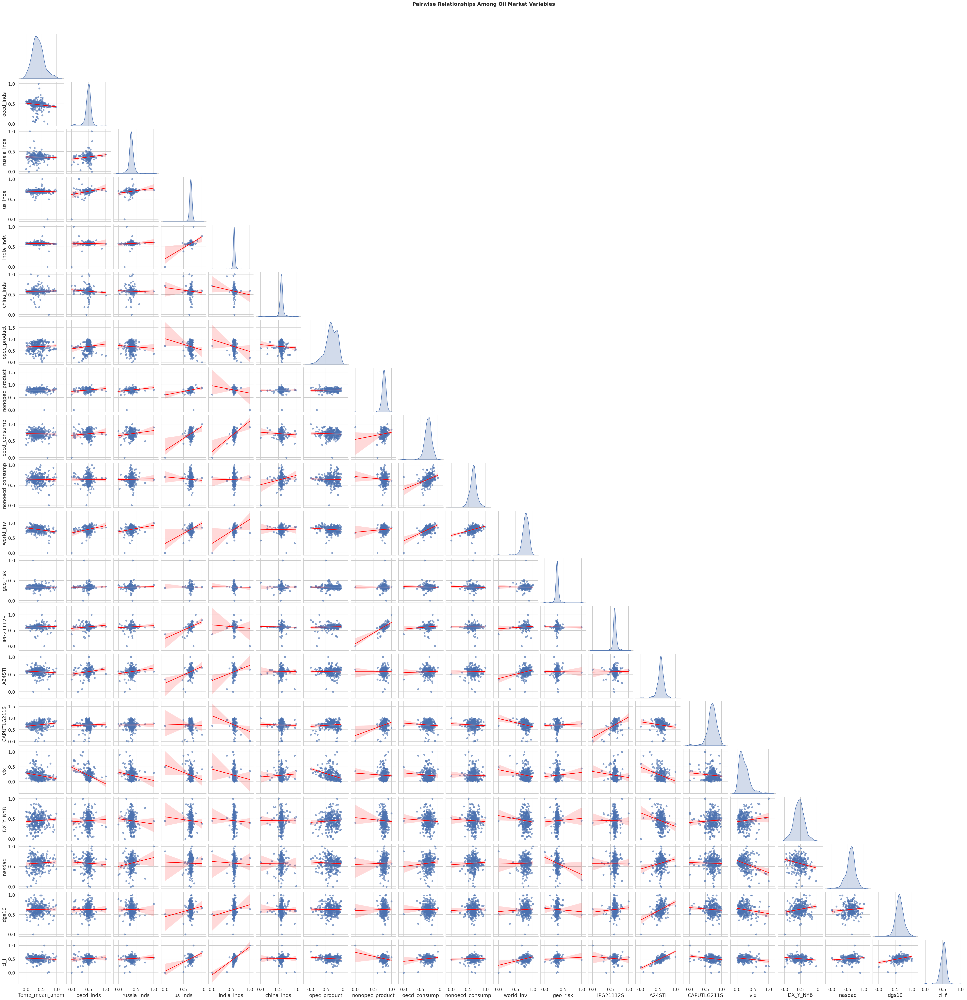

In [14]:
pair_df = df_trans.copy()
pair_df['target'] = target.values
g = sns.pairplot(df_trans,kind="reg",diag_kind="kde", plot_kws={"scatter_kws": {"alpha": 0.6, "s": 35},"line_kws": {"color": "red", "lw": 2}},
    diag_kws={"fill": True},corner=True)

g.fig.suptitle("Pairwise Relationships Among Oil Market Variables",fontsize=18,fontweight="bold",y=1.02)
plt.show()

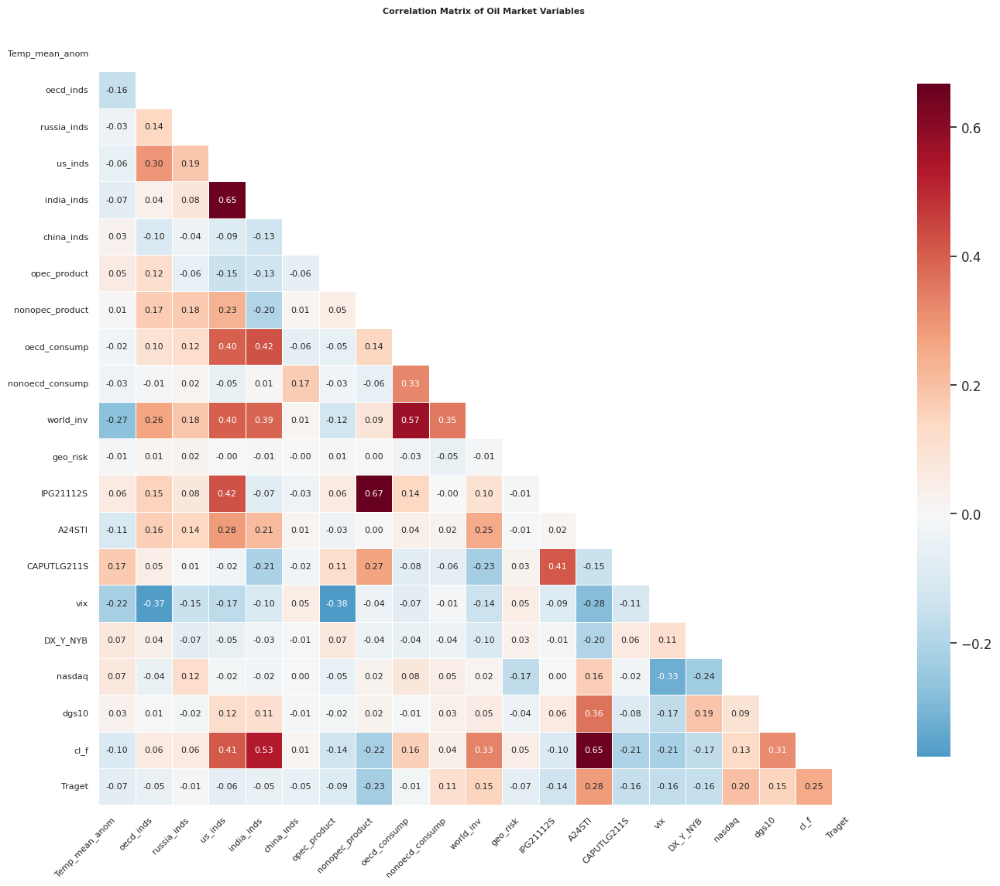

In [15]:
# Compute correlation matrix
cor_data = df_trans.copy()
cor_data['Traget'] = target.values
corr = cor_data.corr(numeric_only=True)
# Create a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Plot
plt.figure(figsize=(14, 12))

sns.set_theme(style="white", font_scale=1.1)

ax = sns.heatmap(corr,mask=mask,annot=True,fmt=".2f",cmap="RdBu_r",center=0,
    square=True,linewidths=0.5,cbar_kws={"shrink": 0.8},annot_kws={"size": 8})
ax.set_xticklabels(ax.get_xticklabels(), fontsize=8, rotation=45)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=8)

plt.title("Correlation Matrix of Oil Market Variables",fontsize=8,fontweight="bold",pad=20)

plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)

plt.tight_layout()
plt.show()

In [16]:
processed_data = df_trans.copy()
processed_data.to_csv("processed_data.csv")